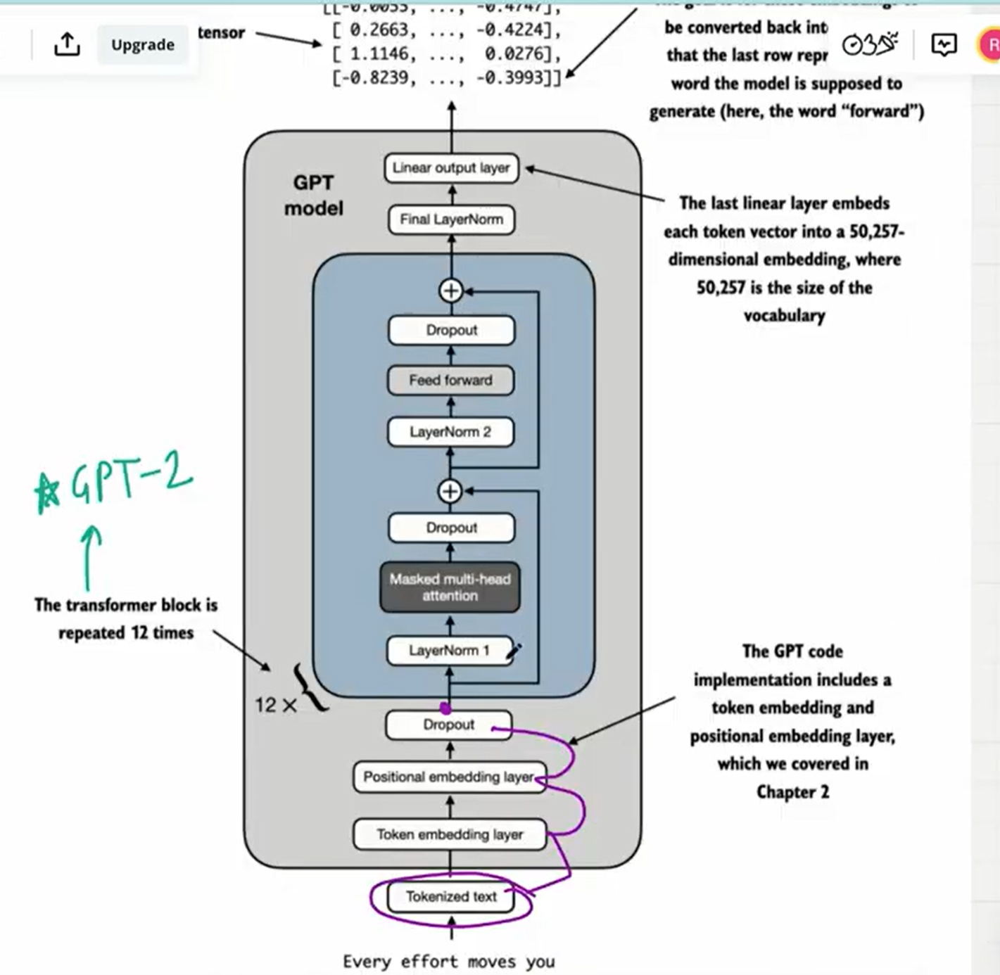

In [1]:
import torch
import torch.nn as nn

In [2]:
##step1:tokenization
import tiktoken
tokenizer=tiktoken.get_encoding("gpt2")
batch=[]
txt1 = "Every effort moves you"
txt2 = "Every day holds a"
batch.append(torch.tensor(tokenizer.encode(txt1)))
batch.append(torch.tensor(tokenizer.encode(txt2)))
batch=torch.stack(batch)
print(batch)

tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])


In [3]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,    # Vocabulary size
    "context_length": 1024, # Context length
    "emb_dim": 768,         # Embedding dimension
    "n_heads": 12,          # Number of attention heads
    "n_layers": 12,         # Number of layers
    "drop_rate": 0.1,       # Dropout rate
    "qkv_bias": False       # Query-Key-Value bias
}

In [4]:
token_embd=nn.Embedding(GPT_CONFIG_124M["vocab_size"],GPT_CONFIG_124M["emb_dim"])
token_embd
# ✅ YES — nn.Embedding creates the embedding vectors automatically, but
# ❌ they have NO meaning at the start.
# ✅ They learn meaning during training.

Embedding(50257, 768)

In [5]:
pos=torch.tensor(50)

In [6]:
token_embd(pos)

tensor([ 0.0722, -1.1797,  0.8005,  0.2397, -2.4432, -0.5885, -1.1046,  1.1006,
        -2.0879, -0.6844, -0.8539,  0.1834,  1.0010, -0.7490, -1.2416,  0.9312,
        -2.2858, -0.7641, -0.2976, -0.2875, -0.9908, -0.8819,  0.3795, -1.9196,
        -0.4697, -1.1473,  2.2368,  0.3360, -0.7247,  1.0198,  1.2746, -0.8637,
         0.5565,  0.9236,  0.1297, -0.4815, -2.2030, -0.7118,  0.2270,  1.8030,
        -0.3542,  1.8673,  0.0841, -1.2999,  0.3818, -0.6348,  0.7444,  0.6461,
         1.7553, -1.1161, -1.4073, -1.8346,  1.9786, -0.0869,  1.1097,  0.9459,
         0.6273,  0.3824,  0.7173, -0.7302,  0.8309,  0.2661, -0.6941,  0.2588,
         0.4390, -0.1411,  0.2208, -1.2623,  0.9089,  0.3347,  0.0903, -0.7455,
        -1.8526,  1.1844, -0.8822, -0.2709, -0.8087,  0.2802, -0.2064,  0.3805,
         0.9956, -1.1648,  1.6043, -0.5423, -0.1625, -1.3745, -0.1013, -0.3251,
        -0.7318,  1.4750, -1.1252,  0.1148, -1.6182, -1.6826,  0.8267, -0.0638,
         0.6087, -1.1255,  0.2215, -0.33

In [7]:
token_embd(pos).shape

torch.Size([768])

In [8]:
# For every token ID in in_idx,
# pick the corresponding row from the embedding table
# 4️⃣ Let’s do ONE TOKEN manually

# Take token:

# 6109

# Internally PyTorch does:

# embedding_vector = token_emb.weight[6109]

# That vector looks like:

# [0.23, -0.81, 0.44, ..., 0.19]  # 768 numbers
# 5️⃣ Now do this for ALL tokens (automatic)

# For:

# [
#  [6109, 3626, 6100, 345],
#  [6109, 1110, 7654, 257]
# ]

# PyTorch converts it into:

# [
#  [
#    vector(6109), vector(3626), vector(6100), vector(345)
#  ],
#  [
#    vector(6109), vector(1110), vector(7654), vector(257)
#  ]
# ]

In [9]:
token_embd(batch)

tensor([[[ 0.7619, -1.0038,  1.5969,  ...,  0.1090,  1.1145, -1.3197],
         [-0.3828,  0.8144, -1.1011,  ...,  0.8150,  1.4354, -0.1103],
         [ 0.6868,  0.3518, -0.7635,  ...,  1.5292,  0.4202, -0.0478],
         [-0.0488, -0.5483, -0.3609,  ..., -1.2318,  0.0079,  0.7770]],

        [[ 0.7619, -1.0038,  1.5969,  ...,  0.1090,  1.1145, -1.3197],
         [-0.3752,  0.8421,  0.2318,  ...,  0.0044, -0.4524, -0.0744],
         [ 0.6283, -0.3560, -0.6975,  ...,  0.4386, -0.8534,  0.5391],
         [ 1.2012, -0.2868,  0.6193,  ...,  0.4703,  0.9693,  0.2461]]],
       grad_fn=<EmbeddingBackward0>)

In [10]:
pos_embd=nn.Embedding(GPT_CONFIG_124M['context_length'],GPT_CONFIG_124M['emb_dim'])
pos_embd
##since position tw jati ota text hamle input dekoxam tesko matra thapauni ho

Embedding(1024, 768)

In [11]:
class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0), \
            "d_out must be divisible by num_heads"

        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # Reduce the projection dim to match desired output dim

        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.out_proj = nn.Linear(d_out, d_out)  # Linear layer to combine head outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer(
            "mask",
            torch.triu(torch.ones(context_length, context_length),
                       diagonal=1)
        )

    def forward(self, x):
        b, num_tokens, d_in = x.shape

        keys = self.W_key(x) # Shape: (b, num_tokens, d_out)
        queries = self.W_query(x)
        values = self.W_value(x)

        # We implicitly split the matrix by adding a `num_heads` dimension
        # Unroll last dim: (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

        # Transpose: (b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
        keys = keys.transpose(1, 2)
        queries = queries.transpose(1, 2)
        values = values.transpose(1, 2)

        # Compute scaled dot-product attention (aka self-attention) with a causal mask
        attn_scores = queries @ keys.transpose(2, 3)  # Dot product for each head

        # Original mask truncated to the number of tokens and converted to boolean
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        # Use the mask to fill attention scores
        attn_scores.masked_fill_(mask_bool, -torch.inf)

        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
        attn_weights = self.dropout(attn_weights)

        # Shape: (b, num_tokens, num_heads, head_dim)
        context_vec = (attn_weights @ values).transpose(1, 2)

        # Combine heads, where self.d_out = self.num_heads * self.head_dim
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
        context_vec = self.out_proj(context_vec) # optional projection

        return context_vec

In [12]:
class FeedForward(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]),
            GELU(),
            nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"]),
        )

    def forward(self, x):
        return self.layers(x)

In [13]:
##layer normalization
class LayerNorm(nn.Module):
    def __init__(self, emb_dim):
        super().__init__()
        self.eps = 1e-5
        self.scale = nn.Parameter(torch.ones(emb_dim))
        self.shift = nn.Parameter(torch.zeros(emb_dim))

    def forward(self, x):
        mean = x.mean(dim=-1, keepdim=True)          # compute mean along last dimension
        var = x.var(dim=-1, keepdim=True, unbiased=False)  # compute variance
        norm_x = (x - mean) / torch.sqrt(var + self.eps)  # normalize
        return self.scale * norm_x + self.shift     # scale and shift


In [14]:
##GELU
class GELU(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(
            torch.sqrt(torch.tensor(2.0 / torch.pi)) *
            (x + 0.044715 * torch.pow(x, 3))
        ))

In [15]:
import torch
import torch.nn as nn

class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()

        self.att = MultiHeadAttention(
            d_in=cfg["emb_dim"],
            d_out=cfg["emb_dim"],
            context_length=cfg["context_length"],
            num_heads=cfg["n_heads"],
            dropout=cfg["drop_rate"],
            qkv_bias=cfg["qkv_bias"]
        )

        self.ff = FeedForward(cfg)

        self.norm1 = LayerNorm(cfg["emb_dim"])
        self.norm2 = LayerNorm(cfg["emb_dim"])

        self.drop_shortcut = nn.Dropout(cfg["drop_rate"])

    def forward(self, x):
        # ---- Attention block with shortcut ----
        shortcut = x
        x = self.norm1(x)
        x = self.att(x)
        x = self.drop_shortcut(x)
        x = x + shortcut   # residual connection

        # ---- FeedForward block with shortcut ----
        shortcut = x
        x = self.norm2(x)
        x = self.ff(x)
        x = self.drop_shortcut(x)
        x = x + shortcut   # residual connection

        return x

In [16]:
# Transformer Block
# ----------------------------
class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.norm1 = LayerNorm(cfg["emb_dim"])
        self.norm2 = LayerNorm(cfg["emb_dim"])
        self.att = MultiHeadAttention(
            d_in=cfg["emb_dim"],
            d_out=cfg["emb_dim"],
            context_length=cfg["context_length"],
            num_heads=cfg["n_heads"],
            dropout=cfg["drop_rate"],
            qkv_bias=cfg["qkv_bias"]
        )
        self.ff = FeedForward(cfg)
        self.drop = nn.Dropout(cfg["drop_rate"])

    def forward(self, x):
        # Attention + residual
        x = x + self.drop(self.att(self.norm1(x)))
        # FeedForward + residual
        x = x + self.drop(self.ff(self.norm2(x)))
        return x

In [17]:
import torch
import torch.nn as nn

# Assuming TransformerBlock and LayerNorm are already defined correctly

class GPTModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()

        # Token embeddings
        self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])

        # Positional embeddings
        self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])

        # Dropout after embeddings
        self.drop_emb = nn.Dropout(cfg["drop_rate"])

        # Transformer blocks
        self.trf_blocks = nn.Sequential(
            *[TransformerBlock(cfg) for _ in range(cfg["n_layers"])]
        )

        # Final LayerNorm
        self.final_norm = LayerNorm(cfg["emb_dim"])

        # Output linear layer (vocab logits)
        self.out_head = nn.Linear(cfg["emb_dim"], cfg["vocab_size"], bias=False)

    def forward(self, in_idx):
        # in_idx shape: [batch_size, seq_len]
        batch_size, seq_len = in_idx.shape

        # Token and positional embeddings
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))

        # Add embeddings and apply dropout
        x = tok_embeds + pos_embeds
        x = self.drop_emb(x)

        # Pass through Transformer blocks
        x = self.trf_blocks(x)

        # Final normalization
        x = self.final_norm(x)

        # Output logits
        logits = self.out_head(x)

        return logits

In [18]:
import torch

# Set random seed for reproducibility
torch.manual_seed(123)

# Create model
model = GPTModel(GPT_CONFIG_124M)

# Forward pass on a batch of token IDs
out = model(batch)

# Print input and output
print("Input batch:\n", batch)
print("\nOutput shape:", out.shape)  # Should be [batch_size, seq_len, vocab_size]
print("\nOutput logits:\n", out)

Input batch:
 tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])

Output shape: torch.Size([2, 4, 50257])

Output logits:
 tensor([[[ 0.3613,  0.4222, -0.0711,  ...,  0.3483,  0.4661, -0.2838],
         [-0.1792, -0.5660, -0.9485,  ...,  0.0477,  0.5181, -0.3168],
         [ 0.7120,  0.0332,  0.1085,  ...,  0.1018, -0.4327, -0.2553],
         [-1.0076,  0.3418, -0.1190,  ...,  0.7195,  0.4023,  0.0532]],

        [[-0.2564,  0.0900,  0.0335,  ...,  0.2659,  0.4454, -0.6806],
         [ 0.1230,  0.3653, -0.2074,  ...,  0.7705,  0.2710,  0.2246],
         [ 1.0558,  1.0318, -0.2800,  ...,  0.6936,  0.3205, -0.3178],
         [-0.1565,  0.3926,  0.3288,  ...,  1.2630, -0.1858,  0.0388]]],
       grad_fn=<UnsafeViewBackward0>)


In [19]:
##now generating next tokens based on probabilities

In [20]:
def generate_text_simple(model, idx, max_new_tokens, context_size):
    # idx is (batch, n_tokens) array of indices in the current context
    for _ in range(max_new_tokens):

        # Crop current context if it exceeds the supported context size
        # E.g., if LLM supports only 5 tokens, and the context size is 10
        # then only the last 5 tokens are used as context
        idx_cond = idx[:, -context_size:]

        # Get the predictions
        with torch.no_grad():
            logits = model(idx_cond)

        # Focus only on the last time step
        # (batch, n_tokens, vocab_size) becomes (batch, vocab_size)
        logits = logits[:, -1, :]

        # Apply softmax to get probabilities
        probas = torch.softmax(logits, dim=-1)  # (batch, vocab_size)

        # Get the idx of the vocab entry with the highest probability value
        idx_next = torch.argmax(probas, dim=-1, keepdim=True)  # (batch, 1)

        # Append sampled index to the running sequence
        idx = torch.cat((idx, idx_next), dim=1)  # (batch, n_tokens+1)

    return idx

In [21]:
start_context = "Hello, I am"
encoded = tokenizer.encode(start_context)
print("encoded:", encoded)
encoded_tensor = torch.tensor(encoded).unsqueeze(0) #A
print("encoded_tensor.shape:", encoded_tensor.shape)

encoded: [15496, 11, 314, 716]
encoded_tensor.shape: torch.Size([1, 4])


In [22]:
model.eval() #A
out = generate_text_simple(
model=model,
idx=encoded_tensor,
max_new_tokens=6,
context_size=GPT_CONFIG_124M["context_length"]
)
print("Output:", out)
print("Output length:", len(out[0]))

Output: tensor([[15496,    11,   314,   716, 27018, 24086, 47843, 30961, 42348,  7267]])
Output length: 10


In [23]:
decoded_text = tokenizer.decode(out.squeeze(0).tolist())
print(decoded_text)

Hello, I am Featureiman Byeswickattribute argue


In [24]:
##but since we have not used training,the next word or tokens(of max_new_tokens=6) is not accurate cozits like random next word prediction and we didnt use the training

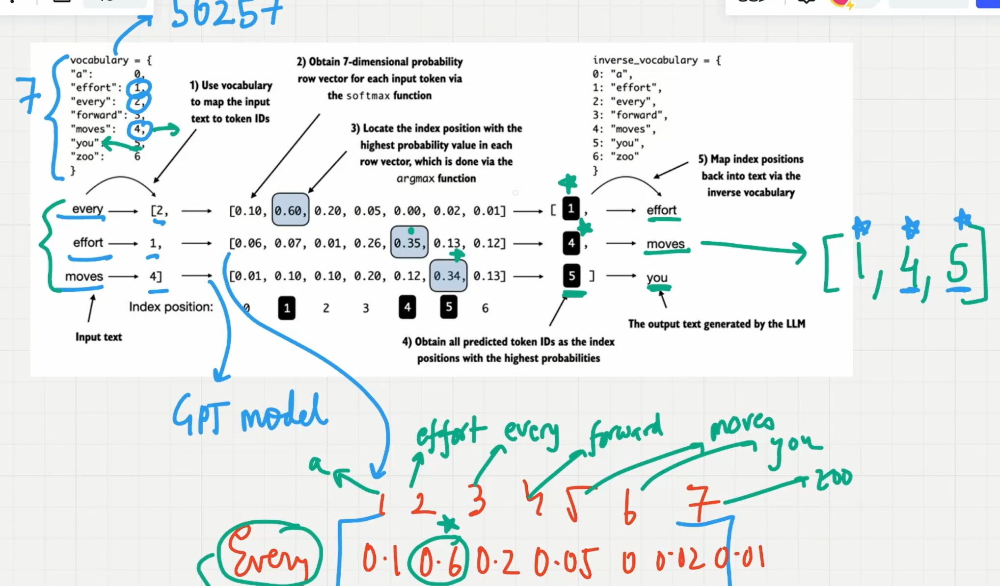

In [25]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,    # Vocabulary size
    "context_length": 1024, # Context length
    "emb_dim": 768,         # Embedding dimension
    "n_heads": 12,          # Number of attention heads
    "n_layers": 12,         # Number of layers
    "drop_rate": 0.1,       # Dropout rate
    "qkv_bias": False       # Query-Key-Value bias
}

In [26]:
import torch
torch.manual_seed(123)
model=GPTModel(GPT_CONFIG_124M)
model.eval()##disabling dropout

GPTModel(
  (tok_emb): Embedding(50257, 768)
  (pos_emb): Embedding(1024, 768)
  (drop_emb): Dropout(p=0.1, inplace=False)
  (trf_blocks): Sequential(
    (0): TransformerBlock(
      (norm1): LayerNorm()
      (norm2): LayerNorm()
      (att): MultiHeadAttention(
        (W_query): Linear(in_features=768, out_features=768, bias=False)
        (W_key): Linear(in_features=768, out_features=768, bias=False)
        (W_value): Linear(in_features=768, out_features=768, bias=False)
        (out_proj): Linear(in_features=768, out_features=768, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (ff): FeedForward(
        (layers): Sequential(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU()
          (2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (drop): Dropout(p=0.1, inplace=False)
    )
    (1): TransformerBlock(
      (norm1): LayerNorm()
      (norm2): LayerNorm()
      (att): MultiHeadAt

In [27]:
import torch
import tiktoken

def text_to_token_ids(text, tokenizer):
    encoded = tokenizer.encode(
        text, allowed_special={'<|endoftext|>'}
    )
    encoded_tensor = torch.tensor(encoded).unsqueeze(0)  # add batch dimension
    return encoded_tensor

def token_ids_to_text(token_ids, tokenizer):
    flat = token_ids.squeeze(0)  # remove batch dimension
    return tokenizer.decode(flat.tolist())

start_context = "Every effort moves you"
tokenizer = tiktoken.get_encoding("gpt2")

model.eval()  # ⭐ IMPORTANT

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(start_context, tokenizer),
    max_new_tokens=10,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 Every effort moves you Aeiman Byeswickattributeometer inspector Normandy freezerigrate


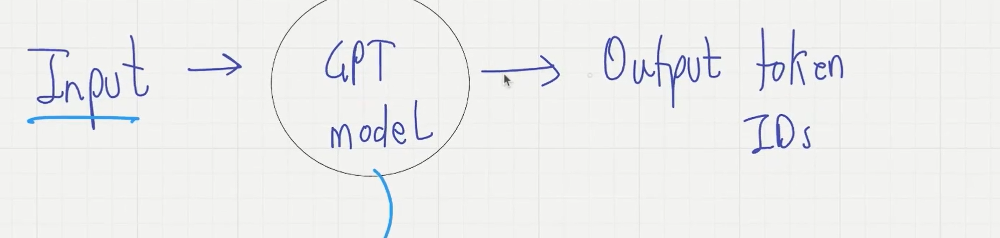

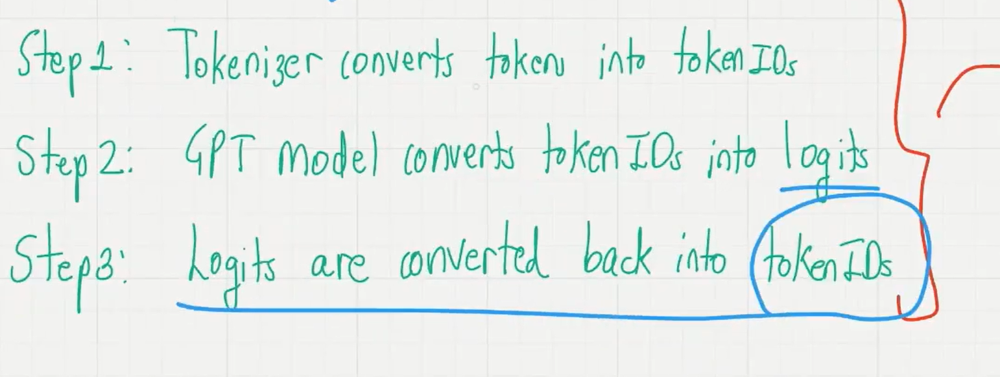
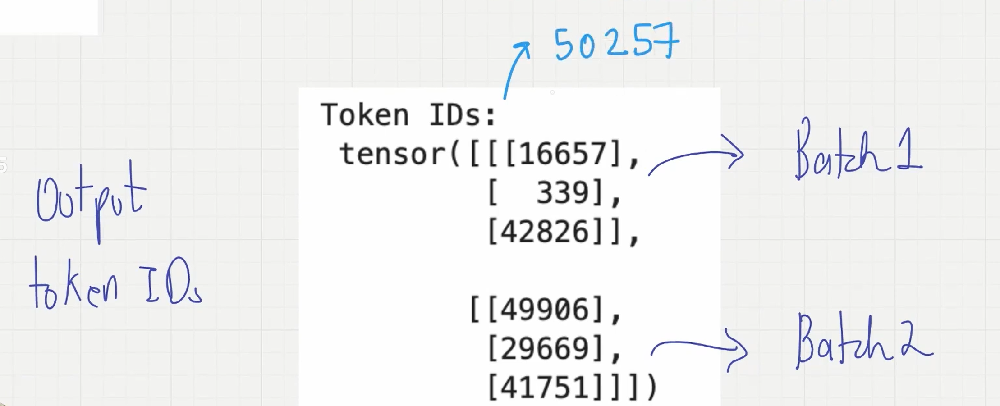

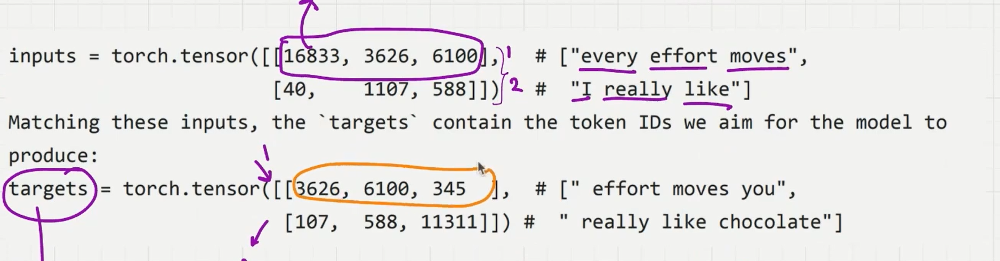

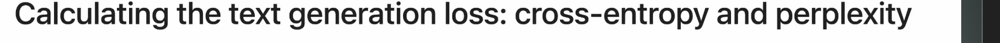

In [28]:
##now suppose i have inputs and targets llike

In [29]:
inputs = torch.tensor([
  [16833, 3626, 6100],   ##["every effort moves",
  [40,    1107,588]    ##  "I really like"]
])

targets=torch.tensor([
    [3626,6100,345],      ## ["effort moves you",
     [1107,588,11311]        ## really like chocolate"]
])

In [30]:
with torch.no_grad():
    logits = model(inputs)
    probas = torch.softmax(logits, dim=-1)

print(probas.shape)

torch.Size([2, 3, 50257])


In [31]:
token_ids=torch.argmax(probas,dim=-1,keepdim=True)
print("Token_Ids",token_ids)

Token_Ids tensor([[[36397],
         [39619],
         [20610]],

        [[ 8615],
         [49289],
         [47105]]])


In [32]:
print(f"Target batch1:{token_ids_to_text(targets[0],tokenizer)}")
print(f"Outputs batch 1:{token_ids_to_text(token_ids[0].flatten(),tokenizer)}")

Target batch1: effort moves you
Outputs batch 1: Gathering SerbianFriday


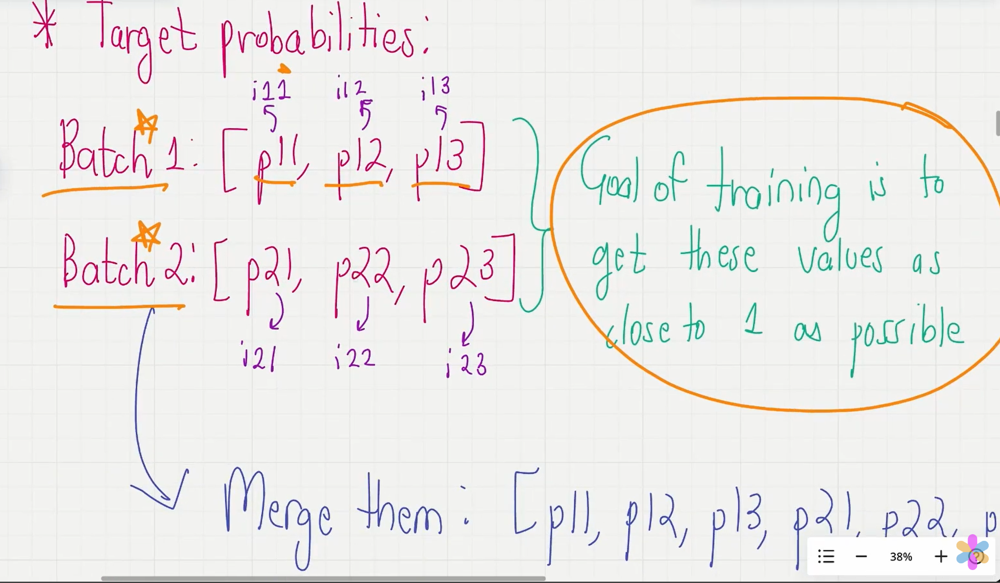

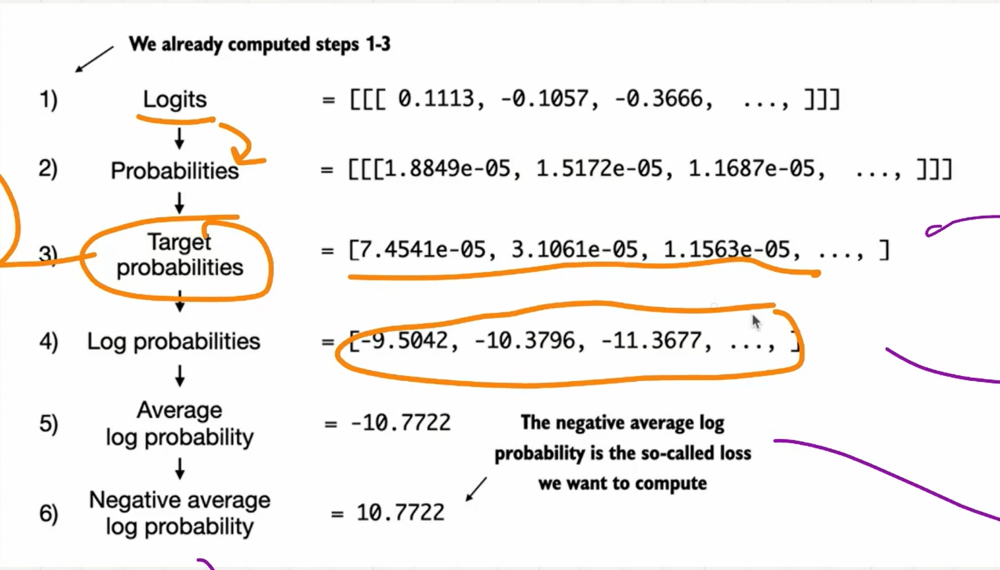

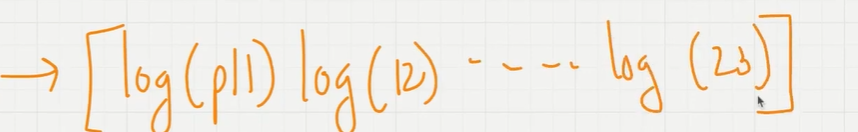

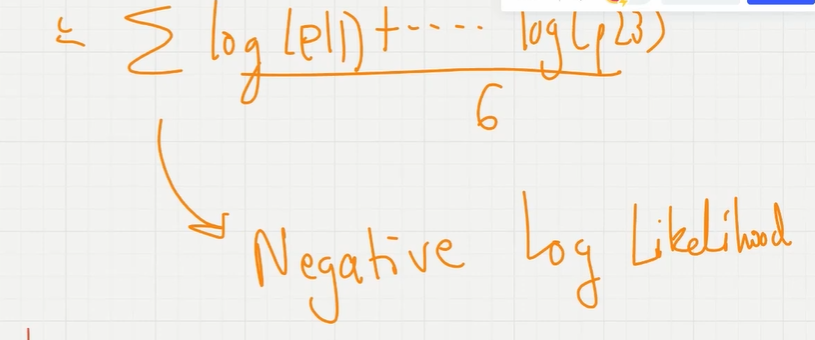

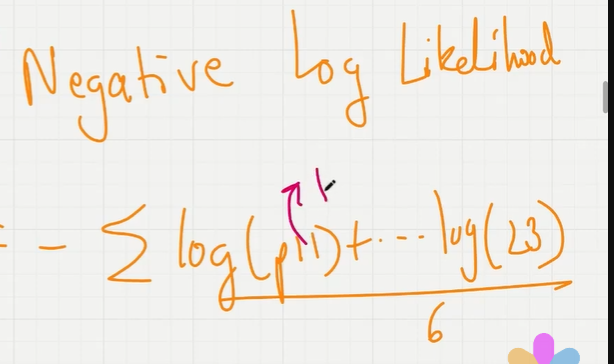

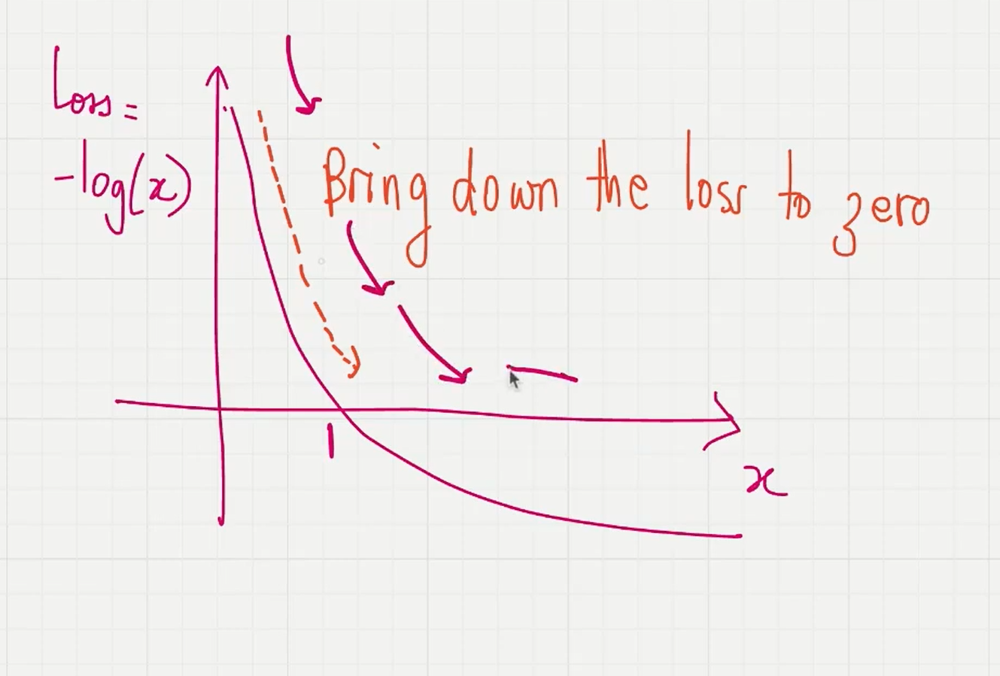

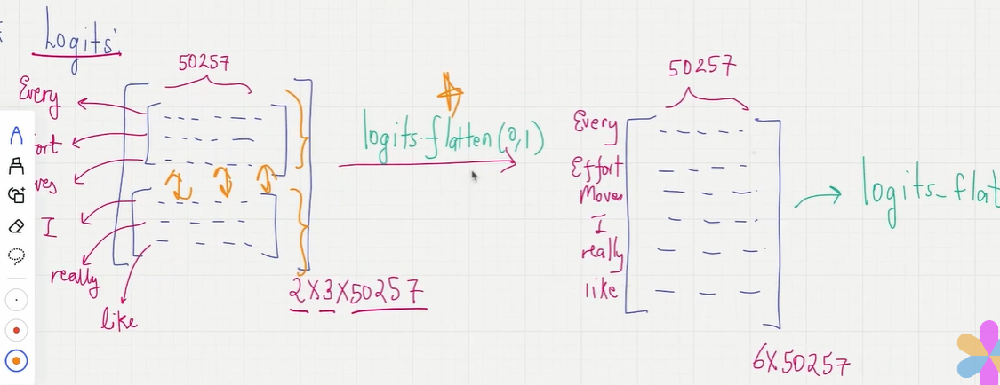

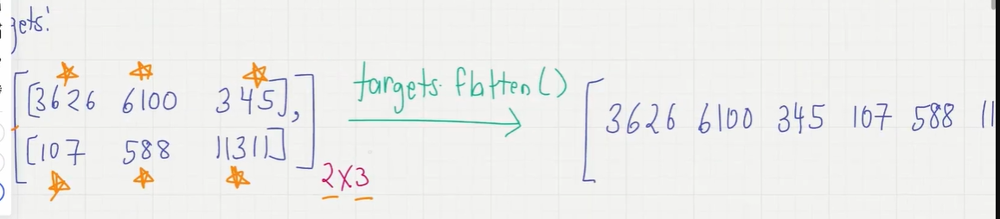

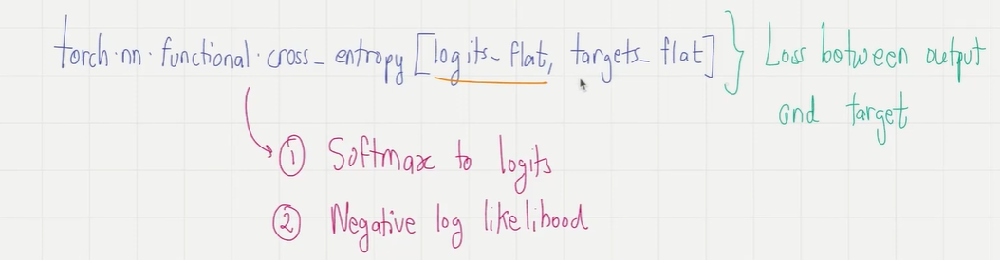

In [33]:
  text_idx=0
  target_probas_1=probas[text_idx,[0,1,2],targets[text_idx]]
  print("text1:",target_probas_1)
  text_idx=1
  target_probas_2=probas[text_idx,[0,1,2],targets[text_idx]]
  print("text2:",target_probas_2)

text1: tensor([2.3466e-05, 2.0531e-05, 1.1733e-05])
text2: tensor([4.2794e-05, 1.6248e-05, 1.1586e-05])


In [34]:
##computing log

In [35]:
log_probas=torch.log(torch.cat((target_probas_1,target_probas_2)))
print(log_probas)


tensor([-10.6600, -10.7936, -11.3531, -10.0591, -11.0276, -11.3658])


In [36]:
##calculating average log probability

In [37]:
avg_log_probas=torch.mean(log_probas)
print(avg_log_probas)

tensor(-10.8765)


In [38]:
##taking -ve of log likelihood

In [39]:
neg_avg_log_probas=avg_log_probas*-1
print(neg_avg_log_probas)

tensor(10.8765)


In [40]:
##we can do all of these using a single line of code that is
## using torch.nn.functional.cross_entropy(logits_flat,targets_flat)

In [41]:
logits

tensor([[[-0.0755, -0.5548,  0.3469,  ...,  0.1516,  0.5015, -1.1592],
         [ 0.2559, -0.8154, -0.6564,  ..., -0.3625,  0.3844, -0.1579],
         [ 0.8914, -0.3270,  0.1289,  ...,  0.0780, -0.3120, -0.1173]],

        [[ 0.5330, -0.2724,  0.9216,  ..., -0.5423,  0.6964, -0.8690],
         [ 0.1809,  0.3803,  0.1456,  ..., -1.0162,  0.6445, -0.2404],
         [ 0.6139,  0.1547,  0.3890,  ..., -0.2707, -0.1842,  0.2355]]])

In [42]:
print(logits.shape)

torch.Size([2, 3, 50257])


In [43]:
targets

tensor([[ 3626,  6100,   345],
        [ 1107,   588, 11311]])

In [44]:
logits_flat=logits.flatten(0,1)
targets_flat=targets.flatten()
print(logits_flat.shape)
print(targets_flat.shape)

torch.Size([6, 50257])
torch.Size([6])


In [45]:
loss=torch.nn.functional.cross_entropy(logits_flat,targets_flat)

In [46]:
print(loss)

tensor(10.8765)


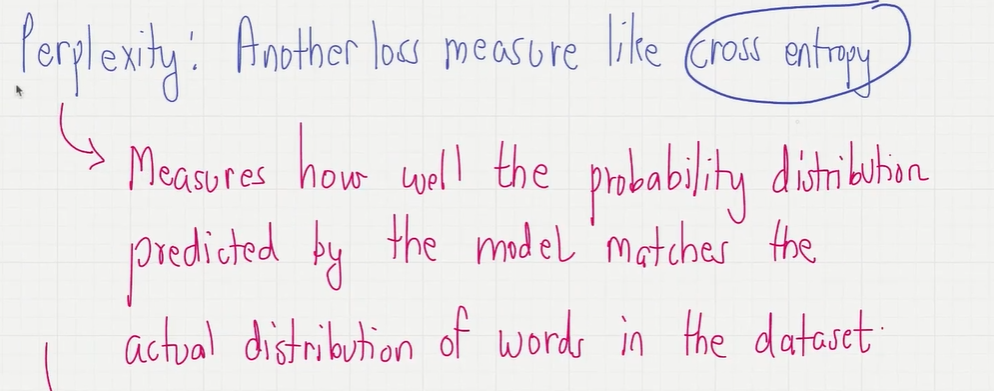

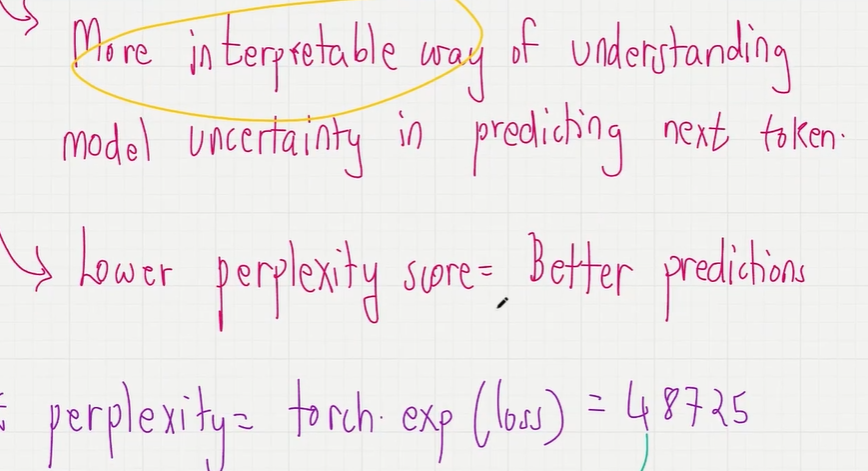

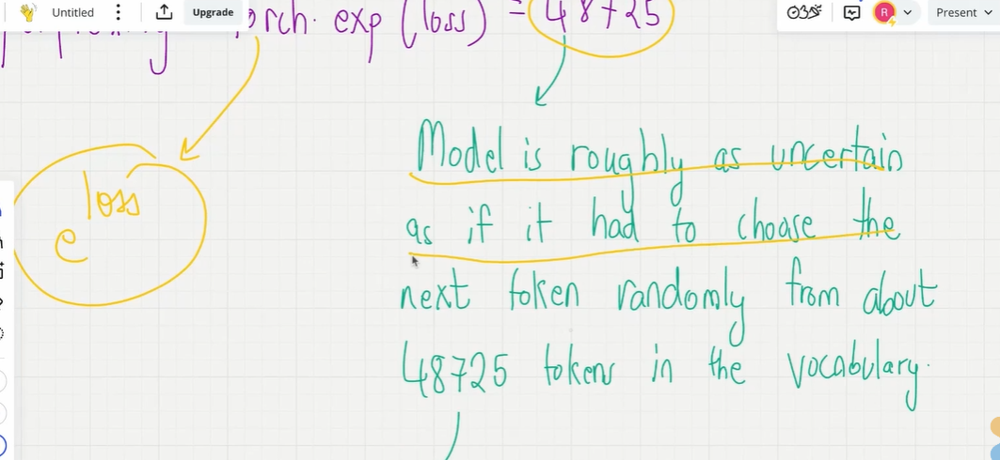

In [47]:
##but if loss=1,e power 1 gives 2.sth,means model had to choose next token from about 2 tokens
##and if lloss=0,e^0=1 means model had one accurate token as a next token

In [48]:
perplexity=torch.exp(loss)
print(perplexity)

tensor(52918.7773)
